-----
<span style="color:Navy">

<h1 align="center">Calliope Hummingbirds Spotted in Texas!</h3>
    
### Notable Observations: What makes them notable?

#### According to the eBird API documentation, notable observations can be for locally or nationally rare species or are otherwise unusual, e.g. over-wintering birds in a species which is normally only a summer visitor.


<span style="color:DarkSlateBlue">

##### Citation for all data used in this notebook: eBird Basic Dataset. Version: EBD_relAug-2020. Cornell Lab of Ornithology, Ithaca, New York. Aug 2020.

-----
<img src="./Resources/Calliope_Range_Map.png" alt="RANGE MAP: Calliope Hummingbird, https://doi.org/10.2173/bow.calhum.01" style="border: 1px solid darkgray" align="left" width="500px">

<span style="color:darkgreen">
<h1 align="center">Notable Observations in Texas</h1>
<h3 align="center">of the</h3>
<h2 align="center">Calliope Hummingbird, Selasphorus calliope</h2>
    
#### Some range maps for the Calliope Hummingbird extend the Fall Migration zone further east in Texas, but the majority limit the range to west Texas or even far west Texas.  The fall migration south is underway as the Calliope make their way to their wintering grounds in the pine oak forests of Mexico.
    
<span style="color:blue">
    
    


### Let's see if we can map the observations of Calliopes in Texas and compare them to observations along the traditional fall southern migration flyway...
   
---

<span style="color:darkgreen">
   
#### Some interesting facts (from WhatBird.com):
    
#### The Calliope Hummingbird is the smallest bird in the United States, yet it travels more than 5,000 miles from the mountains of the northwest to Mexico and back.

#### The Calliope Hummingbird is the smallest breeding bird in North America and the smallest long-distance avian migrant in the world.

#### It prefers high mountains, and has been seen as high as 11,000 feet.
        
#### A group of hummingbirds has many collective nouns, including a “bouquet", "glittering", "hover", "shimmer", and "tune” of hummingbirds.
    
-----
    
##### <blockquote>Image citation: Calder, W. A. and L. L. Calder (2020). Calliope Hummingbird (Selasphorus calliope), version 1.0. In Birds of the World (A. F. Poole and F. B. Gill, Editors). Cornell Lab of Ornithology, Ithaca, NY, USA. https://doi.org/10.2173/bow.calhum.01</blockquote>

-----

<img src="./Resources/Calliope_1.jpg" alt="Calliope Image 1" style="border: 1px solid darkgray" align="right" width="600px">


-----

In [1]:
# import dependencies
import os, csv, requests, json, datetime
import pandas as pd
import numpy as np
import plotly.express as px
from config import api_key, mapbox_token
from datetime import date

%reload_ext lab_black

px.set_mapbox_access_token(mapbox_token)

<span style="color:darkgreen">

# TEXAS


In [4]:
today = date.today()
days_back_short = 3
days_back_long = 30

In [5]:
# ALL notable observations in Texas
regionCode = "US-TX"

url_notables = (
    "https://api.ebird.org/v2/data/obs/"
    + regionCode
    + f"/recent/notable?back={days_back_long}"  # max number of days back for observations = 30
)

r_notables = requests.get(
    url_notables, params={"key": api_key, "back": days_back_long, "detail": "full"}
)

<span style="color:darkgreen">

### Texas Notable Observations Dataframe

In [37]:
df_notables = pd.DataFrame(r_notables.json())

In [38]:
pd.to_datetime(df_notables["obsDt"])
df_notables["Year"] = pd.DatetimeIndex(df_notables["obsDt"]).year
df_notables["Month"] = pd.DatetimeIndex(df_notables["obsDt"]).month
df_notables["Day"] = pd.DatetimeIndex(df_notables["obsDt"]).day

In [39]:
columns_dict = {
    "speciesCode": "Species_Code",
    "comName": "Common_Name",
    "sciName": "Scientific_Name",
    "obsDt": "Date",
    "howMany": "Bird_Count",
    "subnational2Code": "City_Code",
    "subnational2Name": "City_Name",
    "subnational1Code": "State_Code",
    "subnational1Name": "State_Name",
    "countryCode": "Country_Code",
    "countryName": "Country_Name",
}

df_notables = df_notables.rename(columns=columns_dict)

In [40]:
df_notables["Bird_Count"].fillna(value=1, inplace=True)

<span style="color:darkgreen">

### Save data to CSV file

In [41]:
df_notables.to_csv("Resources/TX_NotableObs_eBird.csv", index=False)

In [42]:
TX_NOTABLE_OBS = os.path.join("Resources", "TX_NotableObs_eBird.csv")
TX_NOTABLE_OBS_df = pd.read_csv(TX_NOTABLE_OBS)

<span style="color:darkgreen">

### Some data cleaning

In [43]:
TX_NOTABLE_OBS_df.columns

Index(['Species_Code', 'Common_Name', 'Scientific_Name', 'locId', 'locName',
       'Date', 'Bird_Count', 'lat', 'lng', 'obsValid', 'obsReviewed',
       'locationPrivate', 'subId', 'City_Code', 'City_Name', 'State_Code',
       'State_Name', 'Country_Code', 'Country_Name', 'userDisplayName',
       'obsId', 'checklistId', 'presenceNoted', 'hasComments', 'firstName',
       'lastName', 'hasRichMedia', 'evidence', 'Year', 'Month', 'Day'],
      dtype='object')

In [44]:
TX_NOTABLE_OBS_df.drop_duplicates(inplace=True)

-----

<span style="color:darkgreen">

# Mapping

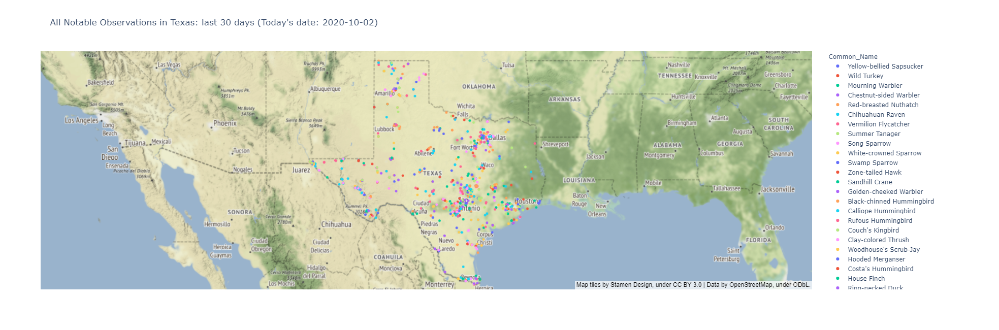

In [45]:
# mapbox_style options:
#     'open-street-map'`,
#     `'white-bg'`, `'carto-positron'`, `'carto-darkmatter'`, `'stamen-
#     terrain'`, `'stamen-toner'`, `'stamen-watercolor'`. 

# Allowed values which do require a Mapbox API token are `'basic'`, `'streets'`,
#     `'outdoors'`, `'light'`, `'dark'`, `'satellite'`, `'satellite-
#     streets'`

fig_TX_NOTABLE_OBS_df = px.scatter_mapbox(
    TX_NOTABLE_OBS_df,
    lat="lat",
    lon="lng",
    color="Common_Name",
    #     size="Bird_Count",
    hover_name="Common_Name",
    hover_data=["Bird_Count", "Date", "obsValid"],
    title=f"All Notable Observations in Texas: last {days_back_long} days (Run date: {today})",
    mapbox_style="stamen-terrain",
    width=1000,
    height=650,
)
fig_TX_NOTABLE_OBS_df.show()

<span style="color:darkgreen">
    
### The eBird API limits the number of records that can be requested at one time to 10,000.  Therefore, it was important to define the area of interest in order to narrow the results to a reasonably-sized dataset. Texas was the obvious choice, and this map shows all observations described as "notable" over the last 30 days.
    
### With this map, one can explore the various notable bird sightings in each area of interest around Texas.  Tooltips identify the comomon name, coordinates, count, date of the observation, and the status of the validity of the observation.

-----

<span style="color:darkgreen">

## Notable Observations - Most common species

In [48]:
name_count = TX_NOTABLE_OBS_df["Common_Name"].value_counts()
name_count_df = name_count.to_frame()
name_count_df

,Common_Name
Calliope Hummingbird,77
Red-necked Phalarope,68
Rufous Hummingbird,61
Sabine's Gull,55
Woodhouse's Scrub-Jay,54
...,...
Red-shouldered Hawk,1
American Kestrel,1
Franklin's Gull,1
Marbled Godwit,1


In [49]:
species = name_count_df["Common_Name"].idxmax()
species

'Calliope Hummingbird'

In [50]:
TX_species_df = TX_NOTABLE_OBS_df.loc[TX_NOTABLE_OBS_df["Common_Name"] == species]
TX_species_df = TX_species_df.reset_index().drop(columns="index")
TX_species_df["Notable_Normal"] = 2
TX_species_df.head(1)

,Species_Code,Common_Name,Scientific_Name,locId,locName,Date,Bird_Count,lat,lng,obsValid,...,presenceNoted,hasComments,firstName,lastName,hasRichMedia,evidence,Year,Month,Day,Notable_Normal
0,calhum,Calliope Hummingbird,Selasphorus calliope,L839995,Riverpark Nature Trails (Sugar Land),2020-10-02 09:23,1.0,29.57722,-95.677732,False,...,False,False,Mark,Scheuerman,False,NaN,2020,10,2,2


<span style="color:darkgreen">

### Save species data to CSV

In [51]:
TX_species_df.to_csv("Resources/TX_Species_Obs_eBird.csv", index=False)

In [52]:
TX_SPECIES_OBS = os.path.join("Resources", "TX_Species_Obs_eBird.csv")
TX_SPECIES_OBS_df = pd.read_csv(TX_SPECIES_OBS)

-----

<span style="color:darkgreen">

## Taxonomy of the Calliope Hummingbird

<span style="color:darkgreen">

#### Calliope Hummingbird in Flight

![alt](Resources/Calliope_2.jpg)

In [53]:
species_code = TX_species_df["Species_Code"][0]

In [54]:
# Get the taxonomy for the most common observed species
url_species_taxonomy = "https://api.ebird.org/v2/ref/taxonomy/ebird"

r_species_taxonomy = requests.get(
    url_species_taxonomy,
    params={"key": api_key, "fmt": "json", "species": species_code},
)

In [55]:
r_species_taxonomy.status_code

200

In [56]:
species_taxonomy = pd.DataFrame(r_species_taxonomy.json())
species_taxonomy

,sciName,comName,speciesCode,category,taxonOrder,bandingCodes,comNameCodes,sciNameCodes,order,familyComName,familySciName
0,Selasphorus calliope,Calliope Hummingbird,calhum,species,4691.0,[CAHU],[],[SECA],Caprimulgiformes,Hummingbirds,Trochilidae


In [57]:
species_taxonomy = species_taxonomy.rename(
    columns={
        "order": "Order",
        "familySciName": "Family_Name",
        "comName": "Common_Name",
        "sciName": "Scientific_Name",
    }
)

<span style="color:darkgreen">

### Save taxonomy data to CSV

In [60]:
species_taxonomy.to_csv("Resources/Species_Taxonomy.csv", index=False)

species_taxonomy_df = pd.read_csv("Resources/Species_Taxonomy.csv")

species_family_name = species_taxonomy_df["Family_Name"][0]    # Work with data from the saved CSV file in order to protect the integrity of the data

<span style="color:darkgreen">

### Add the Family name of the species into the observations dataframe

In [61]:
TX_species_df = TX_species_df.assign(Family_Name=species_family_name)

In [64]:
TX_species_df

,Species_Code,Common_Name,Scientific_Name,locId,locName,Date,Bird_Count,lat,lng,obsValid,...,hasComments,firstName,lastName,hasRichMedia,evidence,Year,Month,Day,Notable_Normal,Family_Name
0,calhum,Calliope Hummingbird,Selasphorus calliope,L839995,Riverpark Nature Trails (Sugar Land),2020-10-02 09:23,1.0,29.577220,-95.677732,False,...,False,Mark,Scheuerman,False,NaN,2020,10,2,2,Trochilidae
1,calhum,Calliope Hummingbird,Selasphorus calliope,L839995,Riverpark Nature Trails (Sugar Land),2020-10-02 07:15,1.0,29.577220,-95.677732,False,...,False,Mark,Scheuerman,False,NaN,2020,10,2,2,Trochilidae
2,calhum,Calliope Hummingbird,Selasphorus calliope,L7330904,DDD Olds Creek Dr,2020-10-01 16:31,1.0,30.618894,-103.982375,False,...,False,D.D.,Currie cc,False,NaN,2020,10,1,2,Trochilidae
3,calhum,Calliope Hummingbird,Selasphorus calliope,L839995,Riverpark Nature Trails (Sugar Land),2020-10-01 16:20,1.0,29.577220,-95.677732,True,...,False,Mark,Scheuerman,True,P,2020,10,1,2,Trochilidae
4,calhum,Calliope Hummingbird,Selasphorus calliope,L839995,Riverpark Nature Trails (Sugar Land),2020-10-01 16:20,1.0,29.577220,-95.677732,True,...,False,Jeff,Schaberg,True,P,2020,10,1,2,Trochilidae
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72,calhum,Calliope Hummingbird,Selasphorus calliope,L12240994,"3217 Palo Duro Dr, San Angelo US-TX 31.41272, ...",2020-09-07 08:59,1.0,31.412724,-100.492746,False,...,False,c.a.,maedgen,True,P,2020,9,7,2,Trochilidae
73,calhum,Calliope Hummingbird,Selasphorus calliope,L12226592,"1505 Crestwood Rd, Austin US-TX (Private Resid...",2020-09-05 14:09,1.0,30.297931,-97.711237,True,...,False,Caleb,Helsel,True,P,2020,9,5,2,Trochilidae
74,calhum,Calliope Hummingbird,Selasphorus calliope,L12225501,"1000 E Railroad Ave, Fort Stockton US-TX 30.89...",2020-09-05 13:21,1.0,30.894155,-102.878718,False,...,False,Greg,Duncan,False,NaN,2020,9,5,2,Trochilidae
75,calhum,Calliope Hummingbird,Selasphorus calliope,L12237021,"1000 E Railroad Ave, Fort Stockton US-TX 30.89...",2020-09-05 13:05,1.0,30.893549,-102.878588,False,...,False,Ted,Zobeck,False,NaN,2020,9,5,2,Trochilidae


-----

<span style="color:darkgreen">
    
## Mapping species-specific observations

<span style="color:darkgreen">
    
### The most commonly sighted bird in the notable category in Texas was identified as the Calliope Hummingbird.  All observations of Calliope in Texas over the last 30 days are shown here.
    
### The question again is: what makes sightings of Calliope around Texas notable?  Recall the range map shown earlier.  Each of these observations falls outside of the normal range for this species.

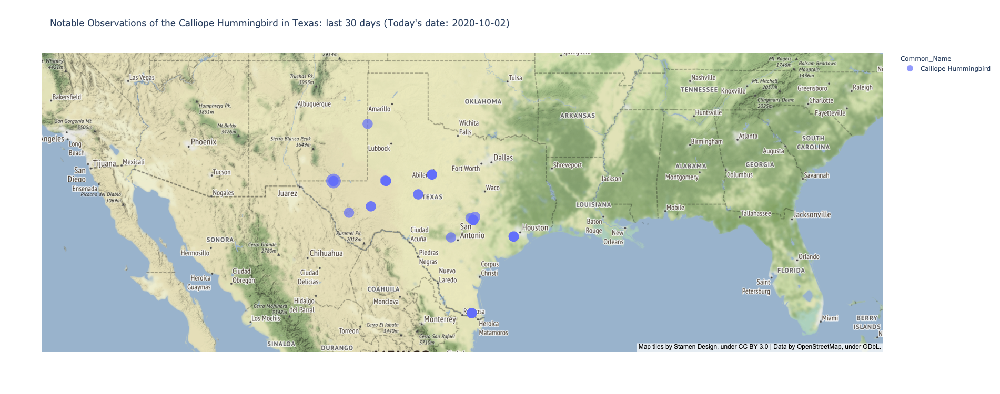

In [63]:
fig_TX_species_df = px.scatter_mapbox(
    TX_species_df,
    lat="lat",
    lon="lng",
    color="Common_Name",
    size="Bird_Count",
    hover_name="Common_Name",
    hover_data=["Common_Name", "Family_Name", "Bird_Count", "Date"],
    title=f"Notable Observations of the {species} in Texas: last {days_back_long} days (Run date: {today})",
    mapbox_style="stamen-terrain",
    width=1100,
    height=750,
)
fig_TX_species_df.show()

-----

<span style="color:darkgreen">

# U.S.

<span style="color:darkgreen">

### Calliope across the US - normal observations

In [66]:
# Get data for specified species observations across the US

regionCodeUS = "US"

url_US_species = (
    f"https://api.ebird.org/v2/data/obs/" + regionCodeUS + "/recent/" + species_code
)

r_US_species = requests.get(
    url_US_species, params={"key": api_key, "back": days_back_long}
)

In [67]:
r_US_species.status_code

200

In [68]:
US_species_df = pd.DataFrame(r_US_species.json())

In [69]:
US_species_df["howMany"].fillna(value=1, inplace=True)

In [70]:
US_species_df["Notable_Normal"] = 1
US_species_df

,speciesCode,comName,sciName,locId,locName,obsDt,howMany,lat,lng,obsValid,obsReviewed,locationPrivate,subId,Notable_Normal
0,calhum,Calliope Hummingbird,Selasphorus calliope,L839995,Riverpark Nature Trails (Sugar Land),2020-10-01 16:20,1.0,29.577220,-95.677732,True,True,False,S74298334,1
1,calhum,Calliope Hummingbird,Selasphorus calliope,L2427011,Chiricahua Mtns.--Whitetail Canyon,2020-10-01 14:23,1.0,31.999401,-109.272012,True,False,True,S74298477,1
2,calhum,Calliope Hummingbird,Selasphorus calliope,L5322975,Joe's Yard,2020-10-01 08:58,1.0,32.295309,-110.815493,True,False,True,S74279465,1
3,calhum,Calliope Hummingbird,Selasphorus calliope,L11047160,Home list,2020-10-01 06:37,1.0,31.417106,-110.245284,True,False,True,S74276679,1
4,calhum,Calliope Hummingbird,Selasphorus calliope,L7988742,Tom's Backyard,2020-09-30 18:12,2.0,32.371215,-106.769178,True,True,True,S74262129,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
465,calhum,Calliope Hummingbird,Selasphorus calliope,L1064211,"7459 S. Tamarac Ct., Centennial Co 80112",2020-09-03 06:30,1.0,39.582936,-104.892483,True,False,True,S73151923,1
466,calhum,Calliope Hummingbird,Selasphorus calliope,L11602760,Lower Smokey Valley Ranches,2020-09-03 06:26,1.0,38.387144,-117.433158,True,False,True,S73143902,1
467,calhum,Calliope Hummingbird,Selasphorus calliope,L478949,US-AZ-Cochise—Portal - West Portal Peak Road (...,2020-09-03 06:20,1.0,31.898164,-109.115932,True,False,True,S73233138,1
468,calhum,Calliope Hummingbird,Selasphorus calliope,L12216003,Deer Creek Camp Ground,2020-09-03 05:35,1.0,33.805288,-109.318983,True,False,True,S73169318,1


In [71]:
US_species_columns_dict = {
    "speciesCode": "Species_Code",
    "comName": "Common_Name",
    "sciName": "Scientific_Name",
    "obsDt": "Date",
    "howMany": "Bird_Count",
}

US_species_df = US_species_df.rename(columns=US_species_columns_dict)

In [72]:
pd.to_datetime(US_species_df["Date"])
US_species_df["Year"] = pd.DatetimeIndex(US_species_df["Date"]).year
US_species_df["Month"] = pd.DatetimeIndex(US_species_df["Date"]).month
US_species_df["Day"] = pd.DatetimeIndex(US_species_df["Date"]).day
US_species_df = US_species_df.assign(Family_Name=species_family_name)

In [73]:
US_species_df.columns

Index(['Species_Code', 'Common_Name', 'Scientific_Name', 'locId', 'locName',
       'Date', 'Bird_Count', 'lat', 'lng', 'obsValid', 'obsReviewed',
       'locationPrivate', 'subId', 'Notable_Normal', 'Year', 'Month', 'Day',
       'Family_Name'],
      dtype='object')

In [74]:
US_species_df = US_species_df.drop(
    columns=["locId", "locName", "obsValid", "obsReviewed", "locationPrivate"]
)
US_species_df.columns

Index(['Species_Code', 'Common_Name', 'Scientific_Name', 'Date', 'Bird_Count',
       'lat', 'lng', 'subId', 'Notable_Normal', 'Year', 'Month', 'Day',
       'Family_Name'],
      dtype='object')

<span style="color:darkgreen">

### Save species-specific data to CSV

In [76]:
US_species_df.to_csv("Resources/US_Species_Obs_eBird.csv", index=False)
US_SPECIES_OBS = os.path.join("Resources", "US_Species_Obs_eBird.csv")
US_SPECIES_OBS_df = pd.read_csv(US_SPECIES_OBS)


In [ ]:
US_SPECIES_OBS_df.drop_duplicates()

In [77]:
TX_SPECIES_OBS_df

,Species_Code,Common_Name,Scientific_Name,locId,locName,Date,Bird_Count,lat,lng,obsValid,...,presenceNoted,hasComments,firstName,lastName,hasRichMedia,evidence,Year,Month,Day,Notable_Normal
0,calhum,Calliope Hummingbird,Selasphorus calliope,L839995,Riverpark Nature Trails (Sugar Land),2020-10-02 09:23,1.0,29.577220,-95.677732,False,...,False,False,Mark,Scheuerman,False,NaN,2020,10,2,2
1,calhum,Calliope Hummingbird,Selasphorus calliope,L839995,Riverpark Nature Trails (Sugar Land),2020-10-02 07:15,1.0,29.577220,-95.677732,False,...,False,False,Mark,Scheuerman,False,NaN,2020,10,2,2
2,calhum,Calliope Hummingbird,Selasphorus calliope,L7330904,DDD Olds Creek Dr,2020-10-01 16:31,1.0,30.618894,-103.982375,False,...,False,False,D.D.,Currie cc,False,NaN,2020,10,1,2
3,calhum,Calliope Hummingbird,Selasphorus calliope,L839995,Riverpark Nature Trails (Sugar Land),2020-10-01 16:20,1.0,29.577220,-95.677732,True,...,False,False,Mark,Scheuerman,True,P,2020,10,1,2
4,calhum,Calliope Hummingbird,Selasphorus calliope,L839995,Riverpark Nature Trails (Sugar Land),2020-10-01 16:20,1.0,29.577220,-95.677732,True,...,False,False,Jeff,Schaberg,True,P,2020,10,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72,calhum,Calliope Hummingbird,Selasphorus calliope,L12240994,"3217 Palo Duro Dr, San Angelo US-TX 31.41272, ...",2020-09-07 08:59,1.0,31.412724,-100.492746,False,...,False,False,c.a.,maedgen,True,P,2020,9,7,2
73,calhum,Calliope Hummingbird,Selasphorus calliope,L12226592,"1505 Crestwood Rd, Austin US-TX (Private Resid...",2020-09-05 14:09,1.0,30.297931,-97.711237,True,...,False,False,Caleb,Helsel,True,P,2020,9,5,2
74,calhum,Calliope Hummingbird,Selasphorus calliope,L12225501,"1000 E Railroad Ave, Fort Stockton US-TX 30.89...",2020-09-05 13:21,1.0,30.894155,-102.878718,False,...,False,False,Greg,Duncan,False,NaN,2020,9,5,2
75,calhum,Calliope Hummingbird,Selasphorus calliope,L12237021,"1000 E Railroad Ave, Fort Stockton US-TX 30.89...",2020-09-05 13:05,1.0,30.893549,-102.878588,False,...,False,False,Ted,Zobeck,False,NaN,2020,9,5,2


In [78]:
TX_SPECIES_OBS_df = TX_species_df.drop(
    columns=[
        "locId",
        "locName",
        "obsValid",
        "obsReviewed",
        "locationPrivate",
        "City_Code",
        "City_Name",
        "State_Code",
        "State_Name",
        "Country_Code",
        "Country_Name",
        "userDisplayName",
        "obsId",
        "checklistId",
        "presenceNoted",
        "hasComments",
        "firstName",
        "lastName",
        "hasRichMedia",
        "evidence",
    ]
)

In [79]:
TX_SPECIES_OBS_df.columns

Index(['Species_Code', 'Common_Name', 'Scientific_Name', 'Date', 'Bird_Count',
       'lat', 'lng', 'subId', 'Year', 'Month', 'Day', 'Notable_Normal',
       'Family_Name'],
      dtype='object')

In [80]:
US_SPECIES_OBS_df.columns

Index(['Species_Code', 'Common_Name', 'Scientific_Name', 'Date', 'Bird_Count',
       'lat', 'lng', 'subId', 'Notable_Normal', 'Year', 'Month', 'Day',
       'Family_Name'],
      dtype='object')

In [82]:
US_SPECIES_OBS_df["Notable"] = "No"
TX_SPECIES_OBS_df["Notable"] = "Yes"

<img src="./Resources/Calliope_clear.jpg" alt="Calliope Image 2" style="border: 1px solid darkgray" align="left" width="500px">

<span style="color:darkgreen">

### Combine the Texas and US dataframes into one and drop duplicates

In [96]:
frames = [US_SPECIES_OBS_df, TX_SPECIES_OBS_df]
result_df = pd.concat(frames)

In [97]:
result_df

,Species_Code,Common_Name,Scientific_Name,Date,Bird_Count,lat,lng,subId,Notable_Normal,Year,Month,Day,Family_Name,Notable
0,calhum,Calliope Hummingbird,Selasphorus calliope,2020-10-01 16:20,1.0,29.577220,-95.677732,S74298334,1,2020,10,1,Trochilidae,No
1,calhum,Calliope Hummingbird,Selasphorus calliope,2020-10-01 14:23,1.0,31.999401,-109.272012,S74298477,1,2020,10,1,Trochilidae,No
2,calhum,Calliope Hummingbird,Selasphorus calliope,2020-10-01 08:58,1.0,32.295309,-110.815493,S74279465,1,2020,10,1,Trochilidae,No
3,calhum,Calliope Hummingbird,Selasphorus calliope,2020-10-01 06:37,1.0,31.417106,-110.245284,S74276679,1,2020,10,1,Trochilidae,No
4,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-30 18:12,2.0,32.371215,-106.769178,S74262129,1,2020,9,30,Trochilidae,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-07 08:59,1.0,31.412724,-100.492746,S73300370,2,2020,9,7,Trochilidae,Yes
73,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-05 14:09,1.0,30.297931,-97.711237,S73225014,2,2020,9,5,Trochilidae,Yes
74,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-05 13:21,1.0,30.894155,-102.878718,S73219442,2,2020,9,5,Trochilidae,Yes
75,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-05 13:05,1.0,30.893549,-102.878588,S73278585,2,2020,9,5,Trochilidae,Yes


In [98]:
result_df.loc[result_df["Notable"] == "Yes"]    # Checking count of Notable observations before removing duplicates

,Species_Code,Common_Name,Scientific_Name,Date,Bird_Count,lat,lng,subId,Notable_Normal,Year,Month,Day,Family_Name,Notable
0,calhum,Calliope Hummingbird,Selasphorus calliope,2020-10-02 09:23,1.0,29.577220,-95.677732,S74319960,2,2020,10,2,Trochilidae,Yes
1,calhum,Calliope Hummingbird,Selasphorus calliope,2020-10-02 07:15,1.0,29.577220,-95.677732,S74312812,2,2020,10,2,Trochilidae,Yes
2,calhum,Calliope Hummingbird,Selasphorus calliope,2020-10-01 16:31,1.0,30.618894,-103.982375,S74293801,2,2020,10,1,Trochilidae,Yes
3,calhum,Calliope Hummingbird,Selasphorus calliope,2020-10-01 16:20,1.0,29.577220,-95.677732,S74298334,2,2020,10,1,Trochilidae,Yes
4,calhum,Calliope Hummingbird,Selasphorus calliope,2020-10-01 16:20,1.0,29.577220,-95.677732,S74300670,2,2020,10,1,Trochilidae,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-07 08:59,1.0,31.412724,-100.492746,S73300370,2,2020,9,7,Trochilidae,Yes
73,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-05 14:09,1.0,30.297931,-97.711237,S73225014,2,2020,9,5,Trochilidae,Yes
74,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-05 13:21,1.0,30.894155,-102.878718,S73219442,2,2020,9,5,Trochilidae,Yes
75,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-05 13:05,1.0,30.893549,-102.878588,S73278585,2,2020,9,5,Trochilidae,Yes


In [99]:
result_df = result_df.drop_duplicates(subset="subId", keep="last")
result_df

,Species_Code,Common_Name,Scientific_Name,Date,Bird_Count,lat,lng,subId,Notable_Normal,Year,Month,Day,Family_Name,Notable
1,calhum,Calliope Hummingbird,Selasphorus calliope,2020-10-01 14:23,1.0,31.999401,-109.272012,S74298477,1,2020,10,1,Trochilidae,No
2,calhum,Calliope Hummingbird,Selasphorus calliope,2020-10-01 08:58,1.0,32.295309,-110.815493,S74279465,1,2020,10,1,Trochilidae,No
3,calhum,Calliope Hummingbird,Selasphorus calliope,2020-10-01 06:37,1.0,31.417106,-110.245284,S74276679,1,2020,10,1,Trochilidae,No
4,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-30 18:12,2.0,32.371215,-106.769178,S74262129,1,2020,9,30,Trochilidae,No
5,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-30 17:38,1.0,31.492044,-110.990056,S74261962,1,2020,9,30,Trochilidae,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-07 08:59,1.0,31.412724,-100.492746,S73300370,2,2020,9,7,Trochilidae,Yes
73,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-05 14:09,1.0,30.297931,-97.711237,S73225014,2,2020,9,5,Trochilidae,Yes
74,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-05 13:21,1.0,30.894155,-102.878718,S73219442,2,2020,9,5,Trochilidae,Yes
75,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-05 13:05,1.0,30.893549,-102.878588,S73278585,2,2020,9,5,Trochilidae,Yes


In [100]:
result_df.loc[result_df["Notable"] == "Yes"]    # Checking count of Notable observations after removing duplicates

,Species_Code,Common_Name,Scientific_Name,Date,Bird_Count,lat,lng,subId,Notable_Normal,Year,Month,Day,Family_Name,Notable
0,calhum,Calliope Hummingbird,Selasphorus calliope,2020-10-02 09:23,1.0,29.577220,-95.677732,S74319960,2,2020,10,2,Trochilidae,Yes
1,calhum,Calliope Hummingbird,Selasphorus calliope,2020-10-02 07:15,1.0,29.577220,-95.677732,S74312812,2,2020,10,2,Trochilidae,Yes
2,calhum,Calliope Hummingbird,Selasphorus calliope,2020-10-01 16:31,1.0,30.618894,-103.982375,S74293801,2,2020,10,1,Trochilidae,Yes
3,calhum,Calliope Hummingbird,Selasphorus calliope,2020-10-01 16:20,1.0,29.577220,-95.677732,S74298334,2,2020,10,1,Trochilidae,Yes
4,calhum,Calliope Hummingbird,Selasphorus calliope,2020-10-01 16:20,1.0,29.577220,-95.677732,S74300670,2,2020,10,1,Trochilidae,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-07 08:59,1.0,31.412724,-100.492746,S73300370,2,2020,9,7,Trochilidae,Yes
73,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-05 14:09,1.0,30.297931,-97.711237,S73225014,2,2020,9,5,Trochilidae,Yes
74,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-05 13:21,1.0,30.894155,-102.878718,S73219442,2,2020,9,5,Trochilidae,Yes
75,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-05 13:05,1.0,30.893549,-102.878588,S73278585,2,2020,9,5,Trochilidae,Yes


<span style="color:darkgreen">

### Save combined dataset to CSV

In [101]:
result_df.to_csv("Resources/Normal_Notable_Obs_Species.csv", index=False)

In [102]:
results_read = os.path.join("Resources", "Normal_Notable_Obs_Species.csv")
results_clean_df = pd.read_csv(results_read)
results_clean_df

,Species_Code,Common_Name,Scientific_Name,Date,Bird_Count,lat,lng,subId,Notable_Normal,Year,Month,Day,Family_Name,Notable
0,calhum,Calliope Hummingbird,Selasphorus calliope,2020-10-01 14:23,1.0,31.999401,-109.272012,S74298477,1,2020,10,1,Trochilidae,No
1,calhum,Calliope Hummingbird,Selasphorus calliope,2020-10-01 08:58,1.0,32.295309,-110.815493,S74279465,1,2020,10,1,Trochilidae,No
2,calhum,Calliope Hummingbird,Selasphorus calliope,2020-10-01 06:37,1.0,31.417106,-110.245284,S74276679,1,2020,10,1,Trochilidae,No
3,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-30 18:12,2.0,32.371215,-106.769178,S74262129,1,2020,9,30,Trochilidae,No
4,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-30 17:38,1.0,31.492044,-110.990056,S74261962,1,2020,9,30,Trochilidae,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
518,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-07 08:59,1.0,31.412724,-100.492746,S73300370,2,2020,9,7,Trochilidae,Yes
519,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-05 14:09,1.0,30.297931,-97.711237,S73225014,2,2020,9,5,Trochilidae,Yes
520,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-05 13:21,1.0,30.894155,-102.878718,S73219442,2,2020,9,5,Trochilidae,Yes
521,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-05 13:05,1.0,30.893549,-102.878588,S73278585,2,2020,9,5,Trochilidae,Yes


<img src="./Resources/Calliope_Illustration.jpg" alt="Calliope Image 1" style="border: 1px solid darkgray" align="right" width="500px">

-----

<span style="color:darkgreen">

## Map of Normal and Notable Observations of the Calliope Hummingbird

In [103]:
results_clean_df = results_clean_df.sort_values(by=["Day"], ignore_index=True)


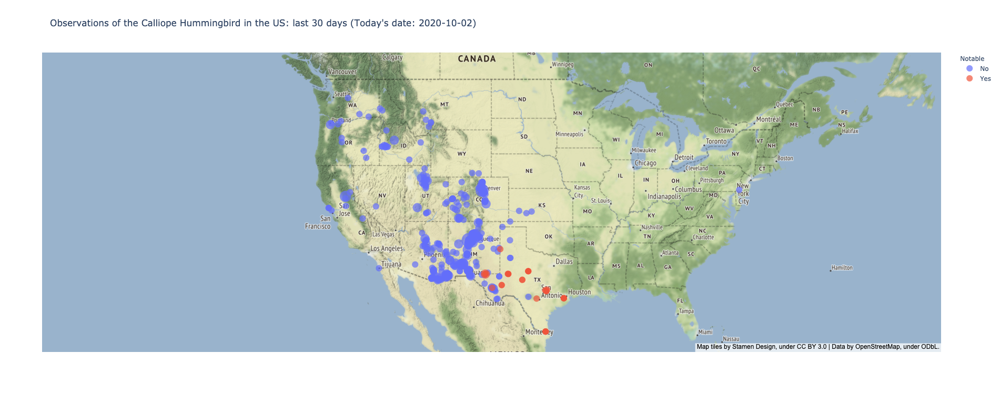

In [105]:
# US_SPECIES_OBS_df["Notable_Normal"] = US_SPECIES_OBS_df["Notable_Normal"].astype(str)
# TX_SPECIES_OBS_df["Notable_Normal"] = TX_SPECIES_OBS_df["Notable_Normal"].astype(str)

fig_results_clean_df = px.scatter_mapbox(
    results_clean_df,
    lat="lat",
    lon="lng",
    color="Notable",
    size="Bird_Count",
    hover_name="Common_Name",
    hover_data=["Scientific_Name", "Family_Name", "Bird_Count", "Date", "Notable"],
    title=f"Observations of the {species} in the US: last {days_back_long} days (Run date: {today})",
    mapbox_style="stamen-terrain",
    width=1000,
    height=750,
)

fig_results_clean_df.show()

<img src="./Resources/RangeMap_Cornell.png" alt="RANGE MAP: Calliope Hummingbird, https://ebird.org/science/status-and-trends/calhum/range-map" style="border: 1px solid darkgray" align="left" width="650px">

<img src="./Resources/Calliope_Range_Map.png" alt="RANGE MAP: Calliope Hummingbird, https://doi.org/10.2173/bow.calhum.01" style="border: 1px solid darkgray" align="right" width="500px">

<span style="color:darkgreen">
<h1 align="center">Observations Outside of Normal Fall Migration Range</h3>
<h3 align="center">Calliope Hummingbird, Selasphorus calliope</h3>
    
### The notable observations are plotted on the map in yellow dots and the normal observations are in purple.  

### Comparing this map to the range map provided by the Cornell Ornithology Lab via eBird.org, it is clear that these observations of the Calliope Hummingbird are considered "notable" due to their distance outside of the normal and predicted range for this species during their migration south to their wintering grounds in Mexico.  Observations can be seen clustering largely in the southwestern states as we progress deeper into migration season.
    
### Range maps are constructed from a combination of scientific observations, citizen observations recorded on eBird.org, and satellite imagery which delineates natural habitats.  According to this range map, Calliope are not expected to travel over the majority of Texas, but rather their movements are typically restricted to west, or even far west, Texas as they fly south for the winter to the pine oak forests of Mexico.
    
##### Map image and information contained herein credited to the Cornell Lab of Ornithology, found here: https://ebird.org/science/status-and-trends/calhum/range-map

-----

<span style="color:darkgreen">

## Observations colored by day show the most recent sightings clustered near the southern border of the US as the birds continue to migrate south.

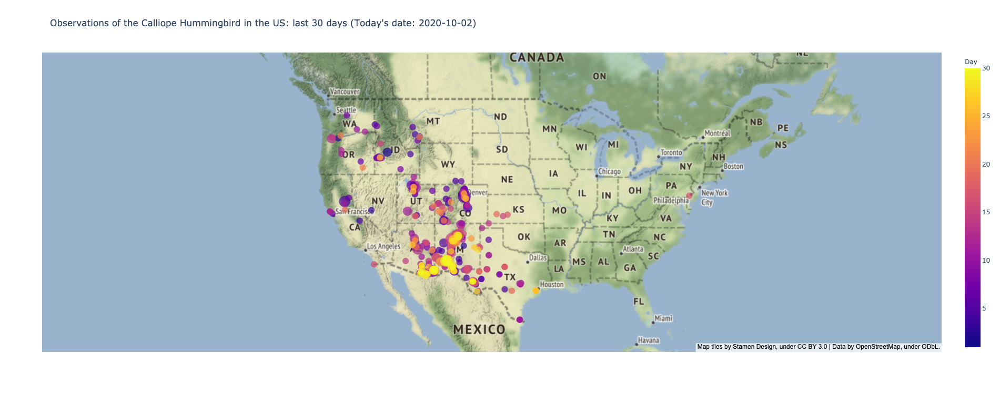

In [104]:
# US_SPECIES_OBS_df["Notable_Normal"] = US_SPECIES_OBS_df["Notable_Normal"].astype(str)
# TX_SPECIES_OBS_df["Notable_Normal"] = TX_SPECIES_OBS_df["Notable_Normal"].astype(str)

fig_results_day_df = px.scatter_mapbox(
    results_clean_df,
    lat="lat",
    lon="lng",
    color="Day",
    size="Bird_Count",
    hover_name="Common_Name",
    hover_data=["Scientific_Name", "Family_Name", "Bird_Count", "Date", "Notable"],
    title=f"Observations of the {species} in the US: last {days_back_long} days (Run date: {today})",
    mapbox_style="stamen-terrain",
    width=1000,
    height=750,
)

fig_results_day_df.show()

<span style="color:darkgreen">

## Animated map showing the notable observations of Calliope in Texas compared to the normal observations located more centrally in the established flyway for fall migration.

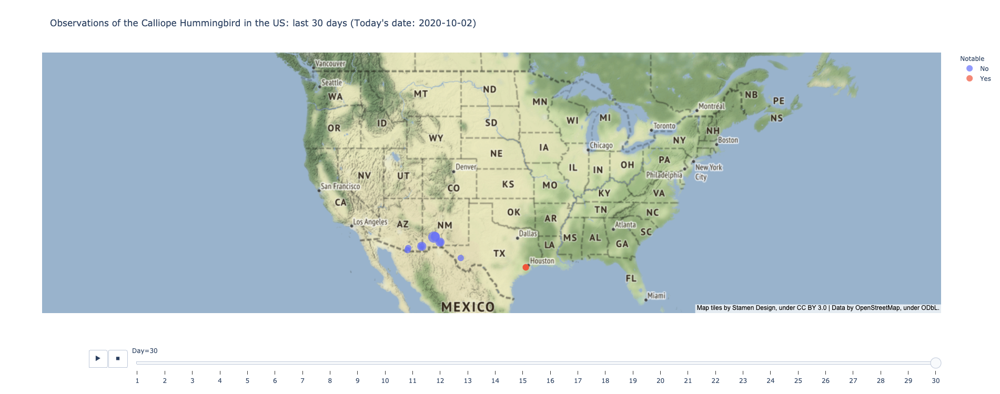

In [106]:
# Animated map of notable and normal sightings

fig_results_clean_df_animate = px.scatter_mapbox(
    results_clean_df,
    lat="lat",
    lon="lng",
    color="Notable",
    size="Bird_Count",
    hover_name="Common_Name",
    hover_data=["Scientific_Name", "Family_Name", "Bird_Count", "Date", "Notable"],
    title=f"Observations of the {species} in the US: last {days_back_long} days (Run date: {today})",
    mapbox_style="stamen-terrain",
    width=1000,
    height=750,
    animation_frame="Day",    # The single line that brings animation to the map based on the parameter indicated
)

fig_results_clean_df_animate.show()

<span style="color:darkgreen">

## The call of the Calliope Hummingbird (audio file from All About Birds, by The Cornell Lab)

In [2]:
## Import sound dependencies
from IPython.display import Audio, display


def calliope_call():
    display(
        Audio(
            url="https://www.allaboutbirds.org/guide/assets/sound/535904.mp3",
            autoplay=True,
        )
    )


calliope_call()


-----

<span style="color:darkgreen">
    
# Limitations and Future Work

### * Incorrect identification of species
### * Dependent on citizen scientists (observations not always consistent)
### * API limit on data request volume

### * Why do these birds sometimes wander far from the normal migratory path?
### * Is there a human element impacting the movements of certain birds?
### * Cause for concern?

-----

<span style="color:darkgreen">

## Notes:
### Data cleaning: 
#### * Renamed columns
#### * Dropped duplicate rows
#### * Dropped unneeded columns
#### * From Date column, created new columns Year, Month, Day, and US_State.
#### * Used .fillna(1) for rows with missing Bird Count data. Filled with a value of "1" since the observation wouldn't have been recorded if there were 0 birds. Also, most observations were of 1 bird.

### Data Sources:
#### * eBird API: pulled data from the Notable Observations endpoint, the Recent Observations by Region endpoint, and the Taxonomy endpoint. From the Taxonomy data, added the specie's family name to the working dataframe to add to the tooltips on the maps.
#### * Calliope Hummingbird call: https://www.allaboutbirds.org/guide/Calliope_Hummingbird/sounds
#### * WhatBird.com: Range map
#### * Range Map from Cornell Lab of Ornithology (https://birdsoftheworld.org/bow/species/calhum/cur/introduction)